**PENGEMBANGAN SISTEM PRESENSI MENGGUNAKAN FACE RECOGNITION BERBASIS MOBILE PADA MAHASISWA JURUSAN TEKNOLOGI INFORMASI**

- Install library (OpenCV Contrib)

In [63]:
! pip install opencv-contrib-python

- Install library Scikit-Learn

In [64]:
! pip install scikit-learn

- Install Itertools

In [65]:
! pip install more-itertools

- Import library

In [66]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

#### prepare dataset

In [67]:
def show_dataset(images_class, label):
    # show data for 1 class
    plt.figure(figsize=(14,5))
    k = 0
    for i in range(1,6):
        plt.subplot(1,5,i)
        try :
            plt.imshow(images_class[k][:,:,::-1])
        except :
            plt.imshow(images_class[k], cmap='gray')
        plt.title(label)
        plt.axis('off')
        plt.tight_layout()
        k += 1
    plt.show()

In [68]:
dataset_folder = "my_face"

names = []
images = []
for folder in os.listdir(dataset_folder):
    for name in os.listdir(os.path.join(dataset_folder, folder))[:70]: # limit only 70 face per class
        img = cv2.imread(os.path.join(dataset_folder + folder, name))
        images.append(img)
        names.append(folder)
print (images)

[None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None]


In [69]:
import os
import cv2

dataset_folder = "my_face"

names = []
images = []

# Loop through folders and read images
for folder in os.listdir(dataset_folder):
    folder_path = os.path.join(dataset_folder, folder)  # Correct folder path
    for name in os.listdir(folder_path)[:70]:  # Limit to 70 images per class
        file_path = os.path.join(folder_path, name)  # Full path to image
        img = cv2.imread(file_path)  # Read the image
        if img is not None:  # Check if image was loaded successfully
            images.append(img)
            names.append(folder)
        else:
            print(f"Failed to load image: {file_path}")

print(f"Total images loaded: {len(images)}")


Total images loaded: 18


In [70]:
labels = np.unique(names)

labels

array(['Dela', 'Mulki', 'Pascalis'], dtype='<U8')

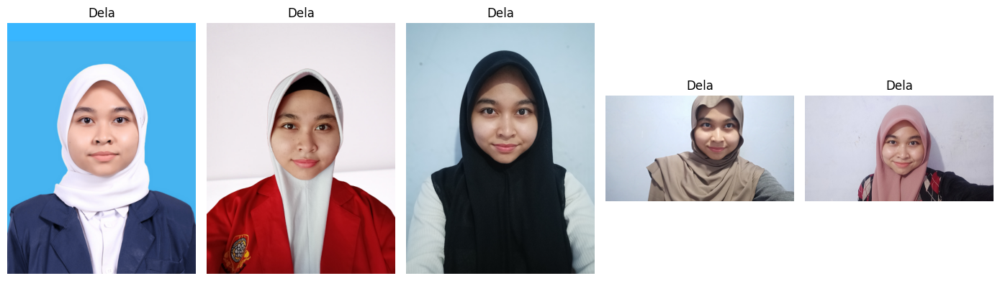

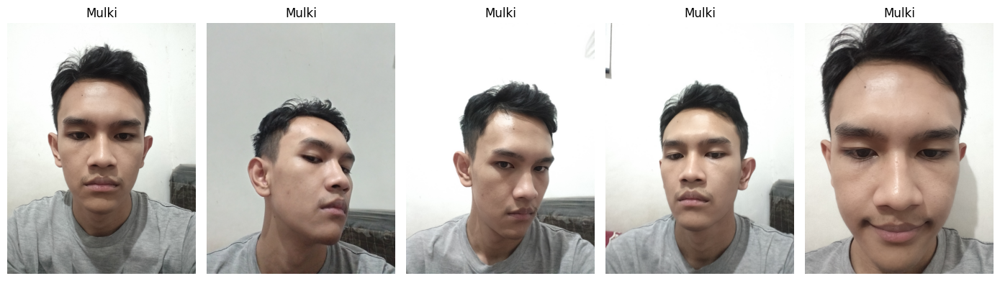

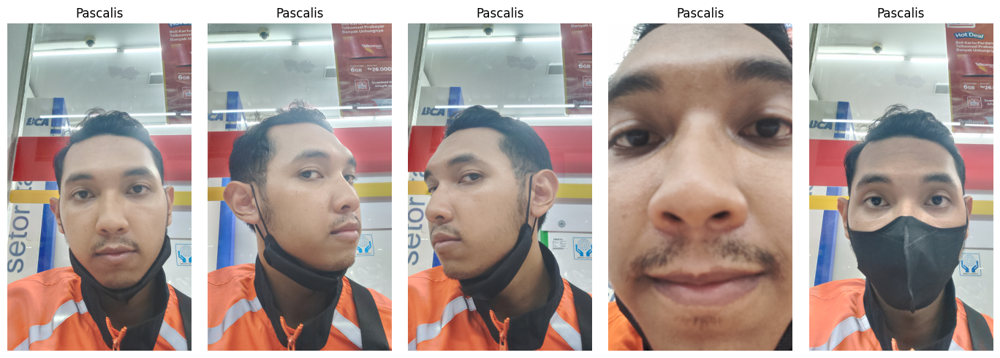

In [71]:
for label in labels:
    ids = np.where(label == np.array(names))[0]
    if ids.size > 0:  # Check if ids is not empty
        images_class = images[ids[0]: ids[-1] + 1]

        # Check if all images are valid
        valid_images = [img for img in images_class if img is not None and img.ndim == 3]

        if valid_images:
            try:
                show_dataset(valid_images, label)
            except Exception as e:
                print(f"Error showing dataset for label {label}: {e}")
        else:
            print(f"No valid images found for label: {label}")
    else:
        print(f"No images found for label: {label}")

Displaying images for label: Dela


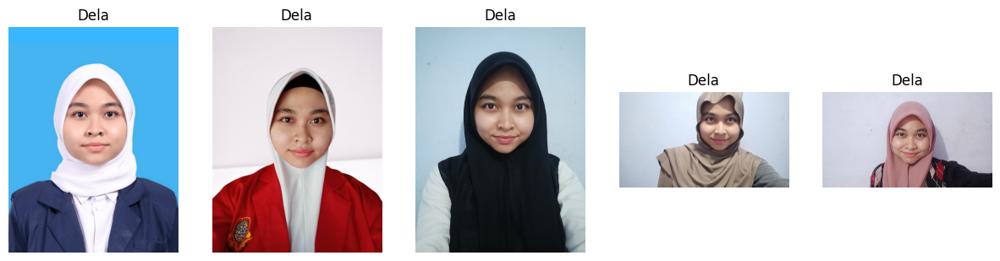

Displaying images for label: Kinata


<Figure size 1500x500 with 0 Axes>

Displaying images for label: Mulki


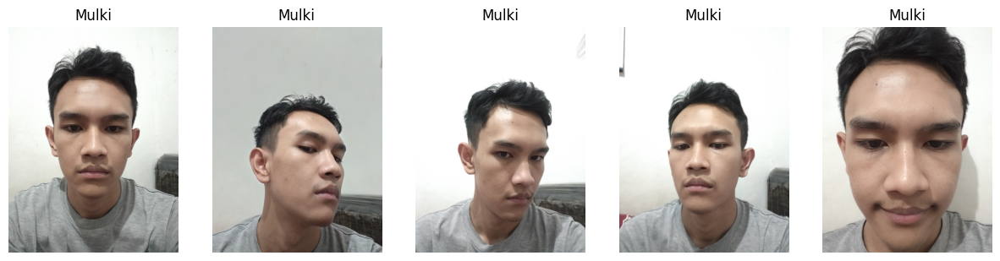

Displaying images for label: Pascalis


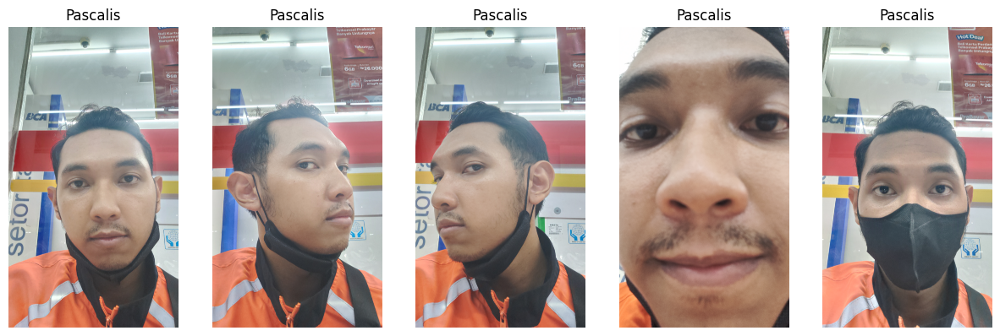

In [72]:
import os
import cv2
import matplotlib.pyplot as plt

dataset_folder = "my_face"

names = []
images = []
labels = os.listdir(dataset_folder)

# Load images and labels
for folder in labels:
    folder_path = os.path.join(dataset_folder, folder)
    for name in os.listdir(folder_path)[:70]:  # Limit to 70 faces per class
        img = cv2.imread(os.path.join(folder_path, name))
        images.append(img)
        names.append(folder)

# Function to display images
def show_images_by_label(images, names, label, n_samples=5):
    # Get indices for the specified label
    indices = [i for i, name in enumerate(names) if name == label]
    # Limit to `n_samples` images
    indices = indices[:n_samples]

    # Plot the images
    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(indices):
        img = images[idx]
        if img is not None:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for Matplotlib
            plt.subplot(1, n_samples, i + 1)
            plt.imshow(img_rgb)
            plt.title(label)
            plt.axis("off")
        else:
            print(f"Image at index {idx} is None.")
    plt.show()

# Display a few images for each label
for label in labels:
    print(f"Displaying images for label: {label}")
    show_images_by_label(images, names, label)


Label: Dela, IDs: [0 1 2 3 4 5 6]
Valid images count for label Dela: 7


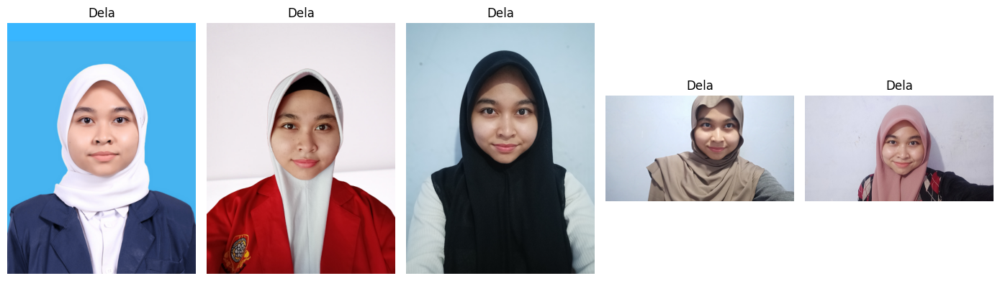

Label: Kinata, IDs: []
No images found for label: Kinata
Label: Mulki, IDs: [ 7  8  9 10 11]
Valid images count for label Mulki: 5


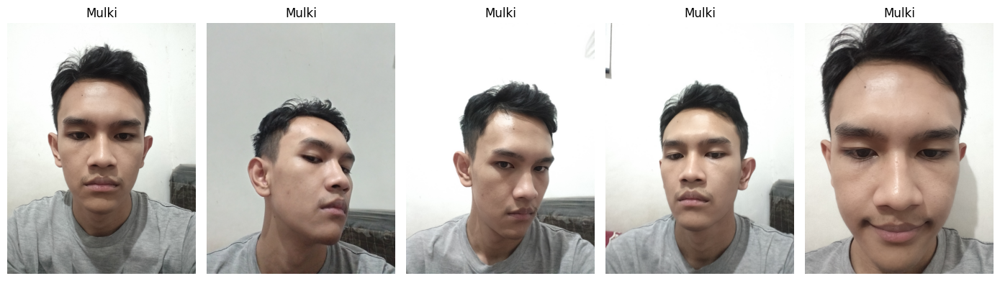

Label: Pascalis, IDs: [12 13 14 15 16 17]
Valid images count for label Pascalis: 6


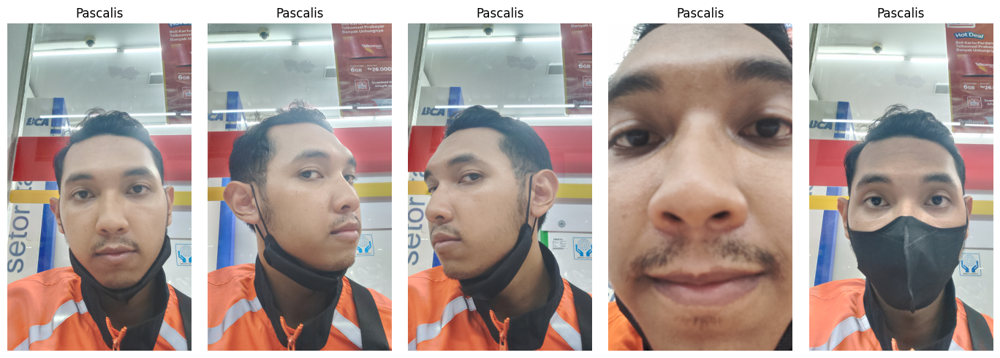

In [73]:
for label in labels:
    ids = np.where(label == np.array(names))[0]
    print(f"Label: {label}, IDs: {ids}")  # Debugging line
    if ids.size > 0:
        images_class = images[ids[0]: ids[-1] + 1]
        valid_images = [img for img in images_class if img is not None and img.ndim == 3]
        print(f"Valid images count for label {label}: {len(valid_images)}")  # Debugging line

        if valid_images:
            try:
                show_dataset(valid_images, label)
            except Exception as e:
                print(f"Error showing dataset for label {label}: {e}")
        else:
            print(f"No valid images found for label: {label}")
    else:
        print(f"No images found for label: {label}")


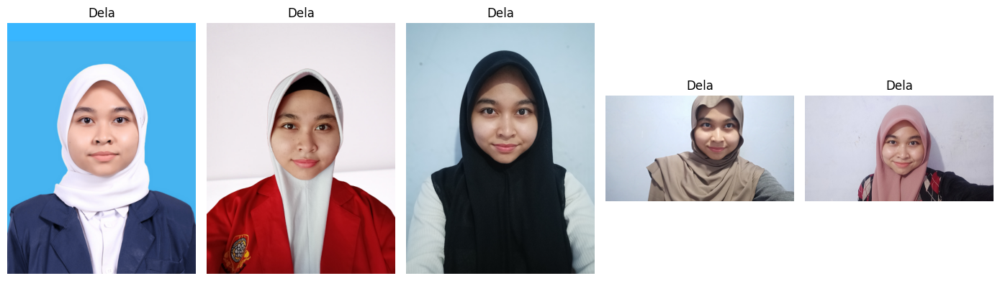

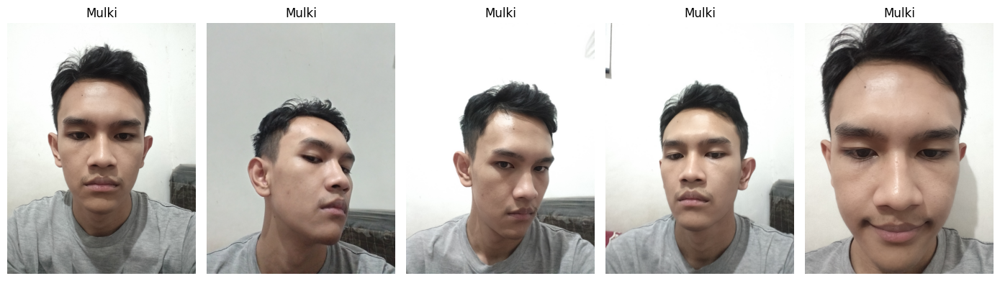

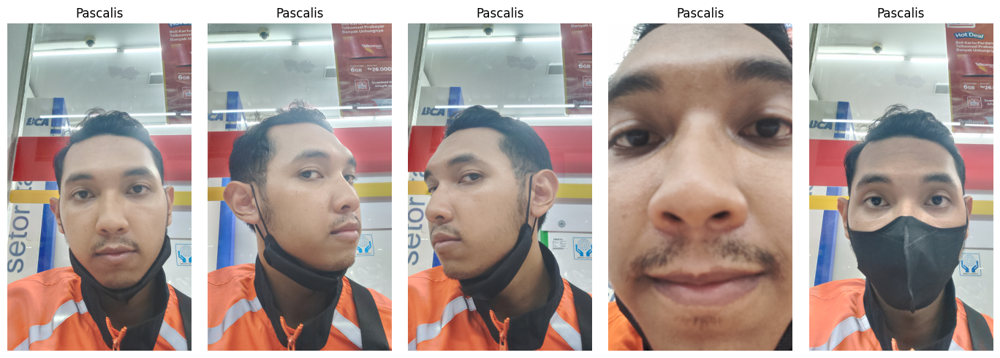

In [74]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_dataset(images_class, label):
    # show data for 1 class
    plt.figure(figsize=(14,5))
    k = 0
    for i in range(1, 6):
        plt.subplot(1, 5, i)
        if k < len(images_class) and images_class[k] is not None:
            try:
                plt.imshow(images_class[k][:, :, ::-1])  # Convert BGR to RGB
            except:
                plt.imshow(images_class[k], cmap='gray')
        else:
            print(f"Image at index {k} is None or out of bounds.")
        plt.title(label)
        plt.axis('off')
        plt.tight_layout()
        k += 1
    plt.show()

dataset_folder = "my_face"

names = []
images = []
for folder in os.listdir(dataset_folder):
    for name in os.listdir(os.path.join(dataset_folder, folder))[:70]:  # limit only 70 face per class
        img_path = os.path.join(dataset_folder, folder, name)
        img = cv2.imread(img_path)
        if img is not None:
            images.append(img)
            names.append(folder)
        else:
            print(f"Image at path {img_path} could not be read and will be skipped.")

labels = np.unique(names)

for label in labels:
    ids = np.where(label == np.array(names))[0]
    if ids.size > 0:  # Check if ids is not empty
        images_class = images[ids[0]: ids[-1] + 1]
        show_dataset(images_class, label)
    else:
        print(f"No images found for label: {label}")


- crop, resize & convert to grayscale for detected face area using **cascade classifier**

In [75]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

In [76]:
def detect_face(img, idx):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(img, 1.3, 5)
    try :
        x, y, w, h = faces[0]

        img = img[y:y+h, x:x+w]
        img = cv2.resize(img, (100, 100))
    except :
        print("Face not found in image index", i)
        img = None
    return img

In [77]:
croped_images = []
for i, img in enumerate(images) :
    img = detect_face(img, i)
    if img is not None :
        croped_images.append(img)
    else :
        del names[i]

error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\objdetect\src\cascadedetect.cpp:1689: error: (-215:Assertion failed) !empty() in function 'cv::CascadeClassifier::detectMultiScale'


In [78]:
# 1. Load Haar Cascade Classifier
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# 2. Verify classifier is loaded
if face_cascade.empty():
    raise Exception("Error loading face cascade classifier")

# 3. Perbaiki fungsi detect_face
def detect_face(img, idx):
    if img is None:
        print(f"Error: Image at index {idx} is None")
        return None
        
    try:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)
        
        if len(faces) == 0:
            print(f"No face detected in image index {idx}")
            return None
            
        x, y, w, h = faces[0]
        face_img = gray[y:y+h, x:x+w]
        face_img = cv2.resize(face_img, (100, 100))
        return face_img
        
    except Exception as e:
        print(f"Error processing image {idx}: {str(e)}")
        return None

# 4. Proses gambar
croped_images = []
valid_names = []  # Untuk menyimpan nama yang valid

for i, img in enumerate(images):
    face_img = detect_face(img, i)
    if face_img is not None:
        croped_images.append(face_img)
        valid_names.append(names[i])

# Update names list
names = valid_names

print(f"Successfully processed {len(croped_images)} faces")

No face detected in image index 5
No face detected in image index 9
No face detected in image index 15
Successfully processed 15 faces


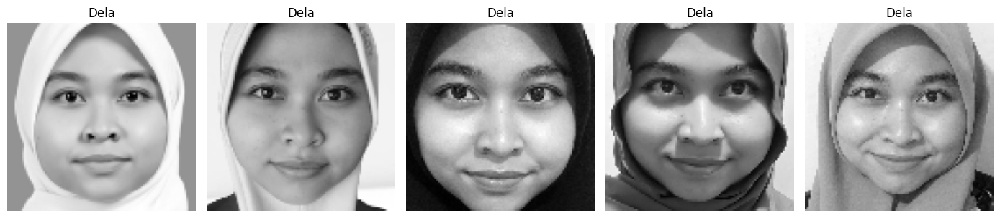

Image at index 4 is None or out of bounds.


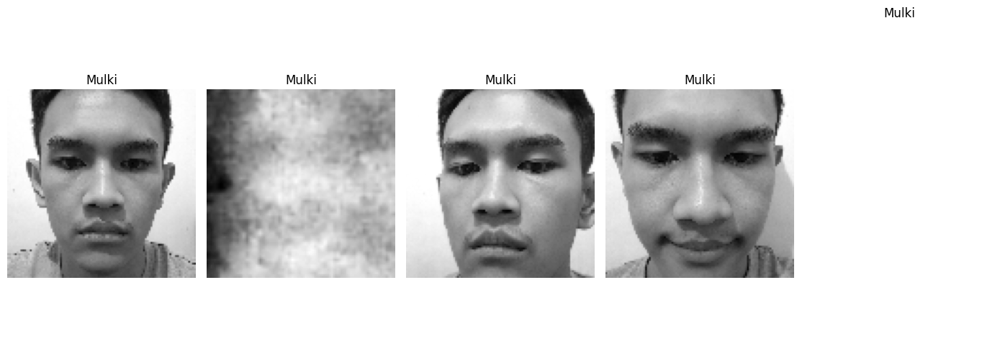

Image at index 4 is None or out of bounds.


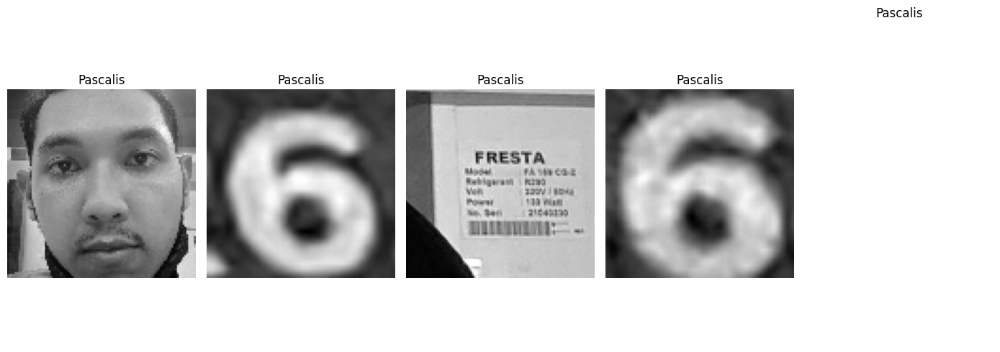

In [80]:
for label in labels:

    ids = np.where(label== np.array(names))[0]
    images_class = croped_images[ids[0] : ids[-1] + 1] # select croped images for each class
    show_dataset(images_class, label)

- encoding names

In [81]:
names

['Dela',
 'Dela',
 'Dela',
 'Dela',
 'Dela',
 'Dela',
 'Mulki',
 'Mulki',
 'Mulki',
 'Mulki',
 'Pascalis',
 'Pascalis',
 'Pascalis',
 'Pascalis',
 'Pascalis']

In [82]:
print(labels)

['Dela' 'Mulki' 'Pascalis']


In [83]:
name_vec = np.array([np.where(name == labels)[0][0] for name in names])

In [84]:
print(name_vec)

[0 0 0 0 0 0 1 1 1 1 2 2 2 2 2]


#### Create Model Facerecognition

In [85]:
pip install face_recognition


  Obtaining dependency information for face_recognition from https://files.pythonhosted.org/packages/1e/95/f6c9330f54ab07bfa032bf3715c12455a381083125d8880c43cbe76bb3d0/face_recognition-1.3.0-py2.py3-none-any.whl.metadata
  Using cached face_recognition-1.3.0-py2.py3-none-any.whl.metadata (21 kB)
  Using cached face_recognition_models-0.3.0-py2.py3-none-any.whl
  Using cached dlib-19.24.6.tar.gz (3.4 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
Using cached face_recognition-1.3.0-py2.py3-none-any.whl (15 kB)
  Running setup.py clean for dlib
Failed to build dlib
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [41 lines of output]
      running bdist_wheel
      running build
      running build_ext
      
      
                         CMake is not installed on your system!
      
          Or it is possible some broken copy of cmake is installed on your system.
          It is unfortunately very common for python package managers to include
          broken copies of cmake.  So if the error above this refers to some file
          path to a cmake file inside a python or anaconda or miniconda path then you
          should delete that broken copy of cmake from your computer.
      
          Instead, please get an official copy of cmake from one of these known good
          sources of an official cmake:
              - cmake.org (this is how windows users should get cmake)
              - apt install cmake (for Ubuntu or Debian based systems)
              - yum instal

In [86]:
pip install dlib


  Using cached dlib-19.24.6.tar.gz (3.4 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py clean for dlib
Failed to build dlib
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [41 lines of output]
      running bdist_wheel
      running build
      running build_ext
      
      
                         CMake is not installed on your system!
      
          Or it is possible some broken copy of cmake is installed on your system.
          It is unfortunately very common for python package managers to include
          broken copies of cmake.  So if the error above this refers to some file
          path to a cmake file inside a python or anaconda or miniconda path then you
          should delete that broken copy of cmake from your computer.
      
          Instead, please get an official copy of cmake from one of these known good
          sources of an official cmake:
              - cmake.org (this is how windows users should get cmake)
              - apt install cmake (for Ubuntu or Debian based systems)
              - yum instal

In [87]:
# Load the Haar Cascade classifier
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Verify the classifier is loaded
if face_cascade.empty():
    raise Exception("Error loading face cascade classifier")

In [88]:
def detect_face(img, idx):
    if img is None:
        print(f"Error: Image at index {idx} is None")
        return None
        
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)
    
    if len(faces) == 0:
        print(f"No face detected in image index {idx}")
        return None
        
    try:
        x, y, w, h = faces[0]
        face_img = gray[y:y+h, x:x+w]
        face_img = cv2.resize(face_img, (100, 100))
        return face_img
    except Exception as e:
        print(f"Error processing face in image index {idx}: {str(e)}")
        return None

In [89]:
def detect_face(img, idx):
    if img is None:
        print(f"Error: Image at index {idx} is None")
        return None
        
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)
    
    if len(faces) == 0:
        print(f"No face detected in image index {idx}")
        return None
        
    try:
        x, y, w, h = faces[0]
        face_img = gray[y:y+h, x:x+w]
        face_img = cv2.resize(face_img, (100, 100))
        return face_img
    except Exception as e:
        print(f"Error processing face in image index {idx}: {str(e)}")
        return None

In [90]:
# Create LBPH face recognizer
model = cv2.face.LBPHFaceRecognizer_create()

In [91]:
# Load dataset dan nama-nama
dataset_folder = "my_face"
names = []
images = []

# Loop through folders and read images
for folder in os.listdir(dataset_folder):
    folder_path = os.path.join(dataset_folder, folder)  # Correct folder path
    for name in os.listdir(folder_path)[:70]:  # Limit to 70 images per class
        file_path = os.path.join(folder_path, name)  # Full path to image
        img = cv2.imread(file_path)  # Read the image
        if img is not None:  # Check if image was loaded successfully
            images.append(img)
            names.append(folder)
        else:
            print(f"Failed to load image: {file_path}")

print(f"Total images loaded: {len(images)}")

# Definisikan labels (nama unik)
labels = np.array(['Dela', 'Pascalis', 'Mulki'])

# Konversi names menjadi name_vec (indeks numerik)
name_vec = np.array([np.where(name == labels)[0][0] for name in names])

# Sekarang baru bisa digunakan untuk training
faces = []
numeric_labels = []
for img, label in zip(croped_images, name_vec):
    if img is not None:
        faces.append(np.array(img, dtype=np.uint8))
        numeric_labels.append(int(label))

# Convert labels to numpy array
numeric_labels = np.array(numeric_labels, dtype=np.int32)

# Train model
if len(faces) > 0:
    model.train(faces, numeric_labels)
    print("Model training completed")
else:
    print("Error: No valid faces for training")

Total images loaded: 18
Model training completed


In [92]:
# Load dataset dan nama-nama
dataset_folder = "my_face"
names = []
images = []

# Loop through folders and read images
for folder in os.listdir(dataset_folder):
    folder_path = os.path.join(dataset_folder, folder)  # Correct folder path
    for name in os.listdir(folder_path)[:70]:  # Limit to 70 images per class
        file_path = os.path.join(folder_path, name)  # Full path to image
        img = cv2.imread(file_path)  # Read the image
        if img is not None:  # Check if image was loaded successfully
            images.append(img)
            names.append(folder)
        else:
            print(f"Failed to load image: {file_path}")

print(f"Total images loaded: {len(images)}")

# Definisikan labels (nama unik)
labels = np.array(['Dela', 'Pascalis', 'Mulki'])

# Konversi names menjadi name_vec (indeks numerik)
name_vec = np.array([np.where(name == labels)[0][0] for name in names])

# Crop wajah dari setiap gambar
croped_images = []
valid_name_vec = []  # Untuk menyimpan label yang sesuai dengan wajah yang terdeteksi

for i, (img, label) in enumerate(zip(images, name_vec)):
    if img is not None:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)
        
        if len(faces) > 0:
            x, y, w, h = faces[0]
            face_img = gray[y:y+h, x:x+w]
            face_img = cv2.resize(face_img, (100, 100))
            croped_images.append(face_img)
            valid_name_vec.append(label)
        else:
            print(f"No face detected in image {i}")

print(f"Total faces detected: {len(croped_images)}")

# Sekarang baru bisa digunakan untuk training
faces = []
numeric_labels = []
for img, label in zip(croped_images, valid_name_vec):
    if img is not None:
        faces.append(np.array(img, dtype=np.uint8))
        numeric_labels.append(int(label))

# Convert labels to numpy array
numeric_labels = np.array(numeric_labels, dtype=np.int32)

# Train model
if len(faces) > 0:
    model.train(faces, numeric_labels)
    print("Model training completed")
else:
    print("Error: No valid faces for training")

Total images loaded: 18
No face detected in image 5
No face detected in image 9
No face detected in image 15
Total faces detected: 15
Model training completed


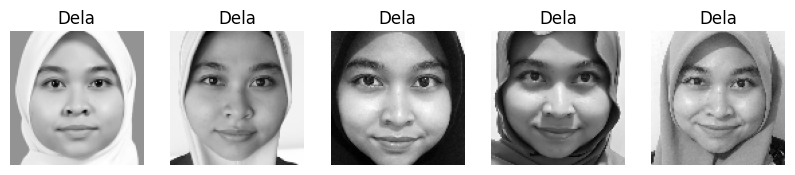

In [93]:
# Tampilkan contoh wajah yang terdeteksi
if len(croped_images) > 0:
    plt.figure(figsize=(10, 2))
    for i in range(min(5, len(croped_images))):
        plt.subplot(1, 5, i+1)
        plt.imshow(croped_images[i], cmap='gray')
        plt.title(labels[valid_name_vec[i]])
        plt.axis('off')
    plt.show()

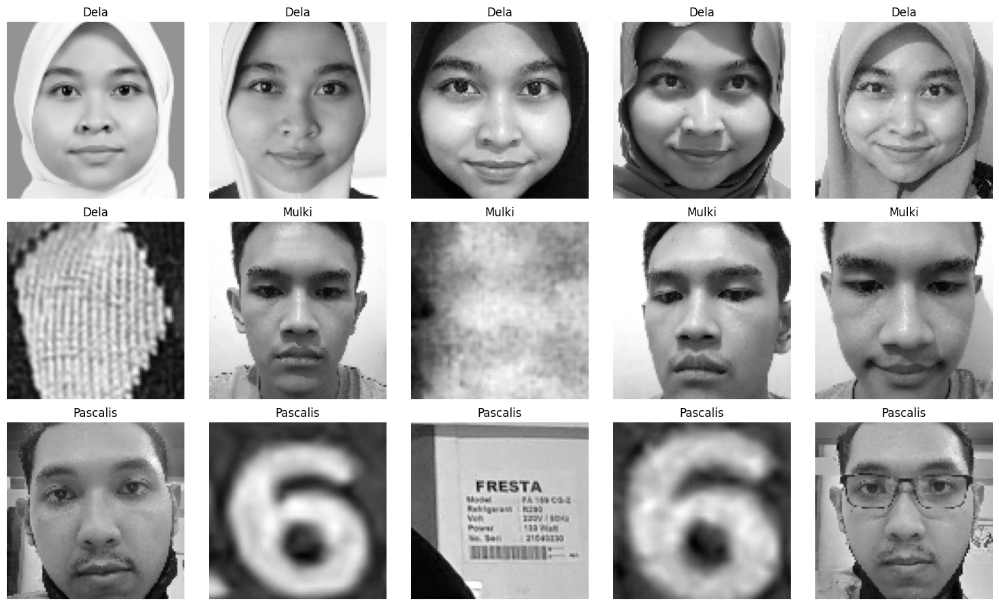

In [94]:
# Tampilkan semua wajah yang terdeteksi
if len(croped_images) > 0:
    # Hitung jumlah baris yang dibutuhkan (5 gambar per baris)
    n_rows = (len(croped_images) + 4) // 5  # Pembulatan ke atas
    
    plt.figure(figsize=(15, 3*n_rows))
    for i in range(len(croped_images)):
        plt.subplot(n_rows, 5, i+1)
        plt.imshow(croped_images[i], cmap='gray')
        plt.title(labels[valid_name_vec[i]])
        plt.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("Tidak ada wajah yang terdeteksi")

- save & load model

In [95]:
model.save("lbph_model.yml")

In [96]:
model.read("lbph_model.yml")

- Test Model

Found:  Pascalis
Confidence:  0.0


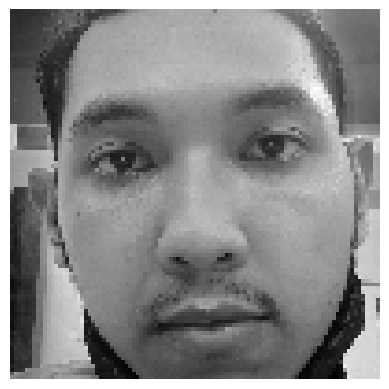

In [97]:
path = "test/Pascalis_0000.jpg"

img = cv2.imread(path)
img = detect_face(img, 0)

idx, confidence = model.predict(img)

print("Found: ", labels[idx])
print("Confidence: ", confidence)

plt.figure()
plt.imshow(img, cmap="gray")
plt.axis(False)
plt.show()

- Apply to all Test dataset

--------------------------------------------------
Image: Dela_0002.jpg
Actual: Dela
Predicted: Dela
Confidence: 0.00%


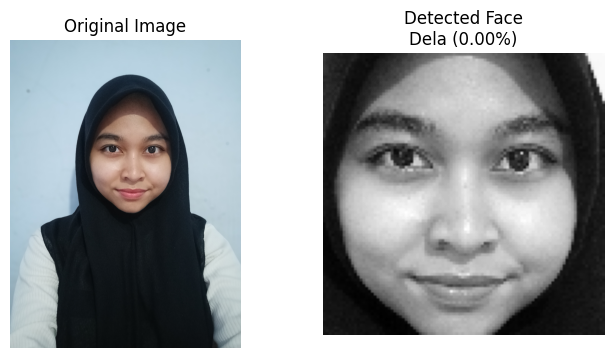

--------------------------------------------------
Image: Mulki_0000.jpg
Actual: Mulki
Predicted: Mulki
Confidence: 0.00%


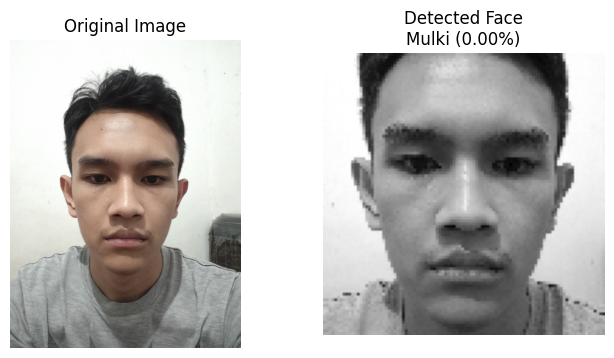

--------------------------------------------------
Image: Mulki_0001.jpg
Actual: Mulki
Predicted: Mulki
Confidence: 0.00%


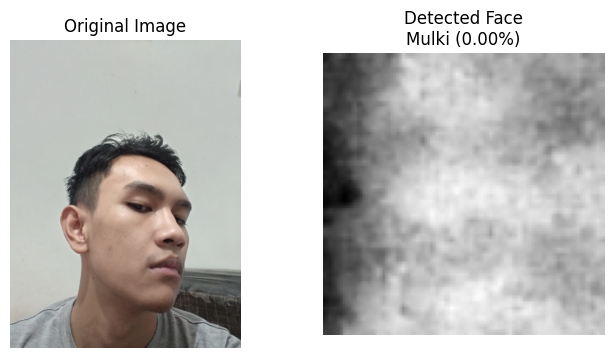

No face detected in image index 0
Error: No face detected in Mulki_0002.jpg
--------------------------------------------------
Image: Mulki_0003.jpg
Actual: Mulki
Predicted: Mulki
Confidence: 0.00%


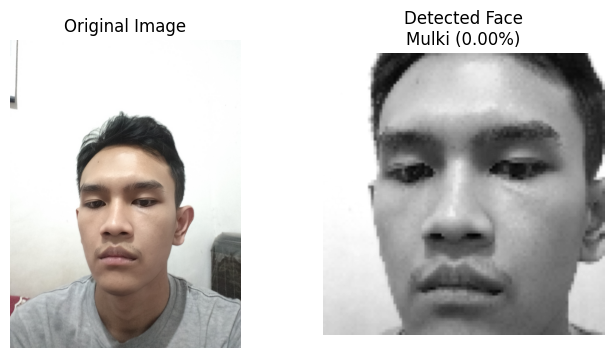

--------------------------------------------------
Image: Mulki_0004.jpg
Actual: Mulki
Predicted: Mulki
Confidence: 0.00%


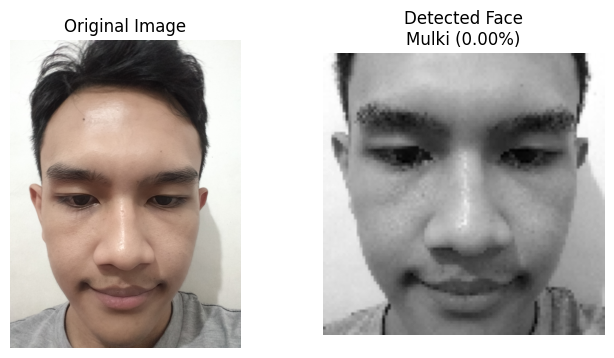

--------------------------------------------------
Image: Pascalis_0000.jpg
Actual: Pascalis
Predicted: Pascalis
Confidence: 0.00%


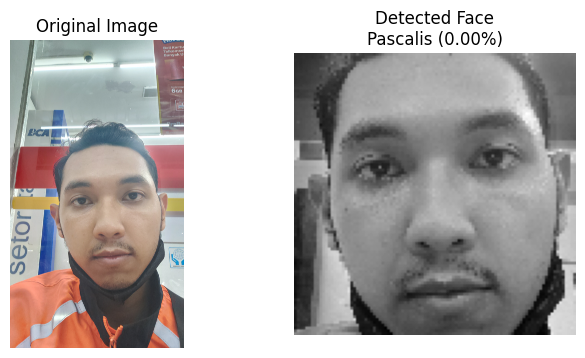

--------------------------------------------------
Image: Pascalis_0001.jpg
Actual: Pascalis
Predicted: Pascalis
Confidence: 0.00%


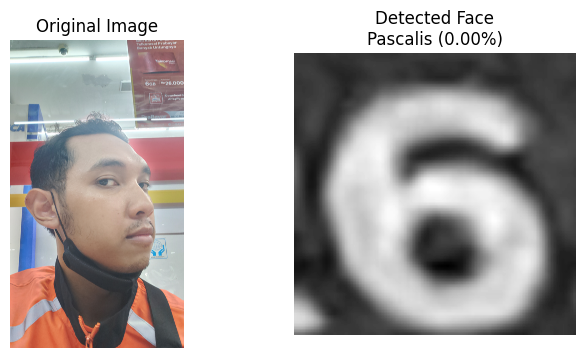

--------------------------------------------------
Image: Pascalis_0002.jpg
Actual: Pascalis
Predicted: Pascalis
Confidence: 0.00%


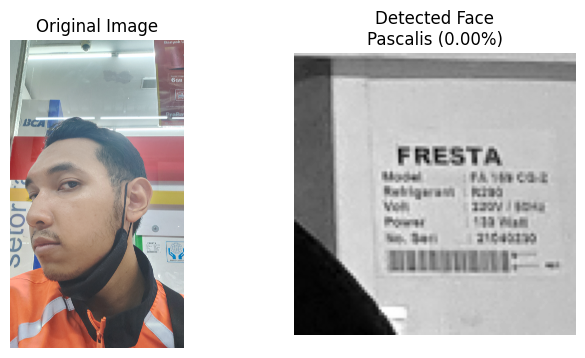

No face detected in image index 0
Error: No face detected in Pascalis_0003.jpg
--------------------------------------------------
Image: Pascalis_0004.jpg
Actual: Pascalis
Predicted: Pascalis
Confidence: 0.00%


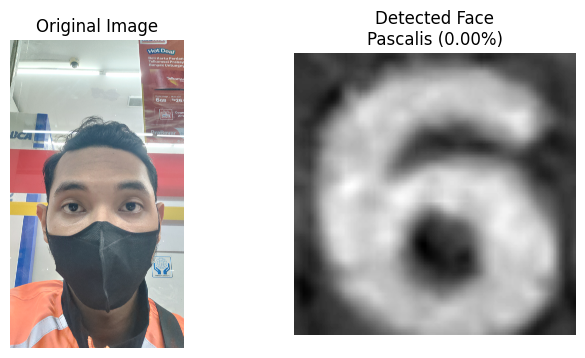

--------------------------------------------------
Image: Pascalis_0005.jpg
Actual: Pascalis
Predicted: Pascalis
Confidence: 0.00%


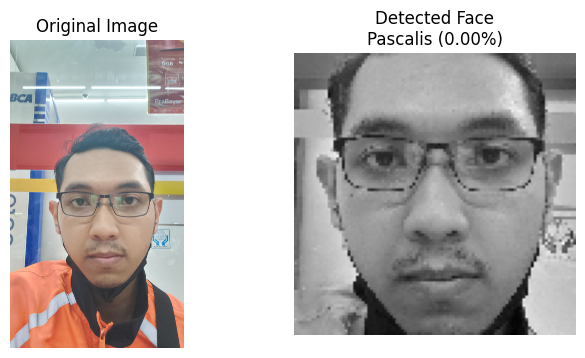


Testing Summary:
Total images tested: 10
Correct predictions: 10
Accuracy: 100.00%


In [99]:
test_folder = "test"
actual_names = []
predicted_names = []
confidences = []

for filename in os.listdir(test_folder):
    if filename.endswith('.jpg'):  # Lebih baik menggunakan endswith
        path = os.path.join(test_folder, filename)
        
        # Get actual name from filename
        actual_name = filename.split('_')[0]  # Ambil nama sebelum underscore
        try:
            actual_idx = np.where(labels == actual_name)[0][0]
        except IndexError:
            print(f"Warning: Label '{actual_name}' not found in labels array")
            continue

        # Read and process image
        img = cv2.imread(path)
        if img is None:
            print(f"Error: Cannot read image {path}")
            continue
            
        face_img = detect_face(img, 0)
        if face_img is None:
            print(f"Error: No face detected in {filename}")
            continue

        try:
            # Predict
            idx, confidence = model.predict(face_img)
            
            # Store results
            actual_names.append(actual_idx)
            predicted_names.append(idx)
            confidences.append(confidence)

            # Print results
            print("-" * 50)
            print(f"Image: {filename}")
            print(f"Actual: {actual_name}")
            print(f"Predicted: {labels[idx]}")
            print(f"Confidence: {confidence:.2f}%")

            # Display image
            plt.figure(figsize=(8, 4))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title('Original Image')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(face_img, cmap='gray')
            plt.title(f'Detected Face\n{labels[idx]} ({confidence:.2f}%)')
            plt.axis('off')
            plt.show()

        except Exception as e:
            print(f"Error processing {filename}: {str(e)}")
            continue

# Print summary if we have results
if len(actual_names) > 0:
    print("\nTesting Summary:")
    print(f"Total images tested: {len(actual_names)}")
    correct = sum(1 for a, p in zip(actual_names, predicted_names) if a == p)
    accuracy = (correct / len(actual_names)) * 100
    print(f"Correct predictions: {correct}")
    print(f"Accuracy: {accuracy:.2f}%")
else:
    print("No images were successfully processed")

Found: Dela
Confidence: 0.0


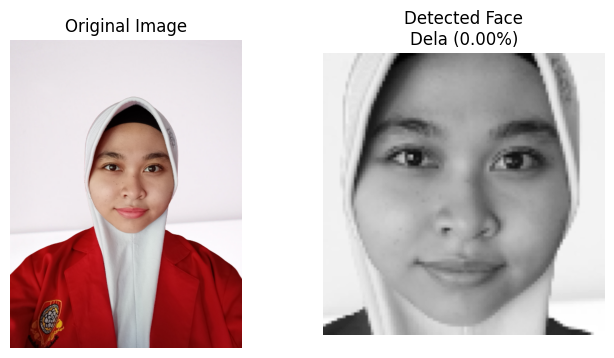

In [100]:
# Test single image
def test_single_image(image_path, model, labels):
    # Read image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Cannot read image from {image_path}")
        return
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Detect face
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    
    if len(faces) == 0:
        print("No face detected in the image")
        return
        
    # Process the first face found
    x, y, w, h = faces[0]
    face_img = gray[y:y+h, x:x+w]
    face_img = cv2.resize(face_img, (100, 100))
    
    try:
        # Predict
        idx, confidence = model.predict(face_img)
        print("Found:", labels[idx])
        print("Confidence:", confidence)
        
        # Display result
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(face_img, cmap='gray')
        plt.title(f'Detected Face\n{labels[idx]} ({confidence:.2f}%)')
        plt.axis('off')
        plt.show()
        
    except Exception as e:
        print(f"Error during prediction: {str(e)}")

# Test the image
path = "test/Dela_0001.png"  # Sesuaikan dengan path yang benar
test_single_image(path, model, labels)

- Result summary

In [101]:
pip install numpy==1.24.3

Note: you may need to restart the kernel to use updated packages.


In [102]:
from sklearn.metrics import confusion_matrix

In [103]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(6, 6))

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

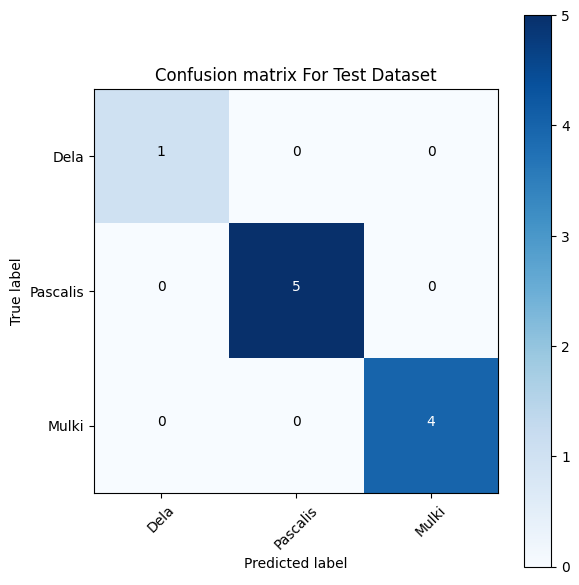

In [104]:


# Compute confusion matrix
cnf_matrix = confusion_matrix(actual_names, predicted_names)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plot_confusion_matrix(cnf_matrix, classes=labels,normalize=False,
                      title='Confusion matrix For Test Dataset')

In [105]:
from sklearn.metrics import classification_report

In [106]:
print("== Classification Report for Test Dataset ==\n")
print(classification_report(actual_names,
                            predicted_names,
                            target_names=labels))

== Classification Report for Test Dataset ==

              precision    recall  f1-score   support

        Dela       1.00      1.00      1.00         1
    Pascalis       1.00      1.00      1.00         5
       Mulki       1.00      1.00      1.00         4

    accuracy                           1.00        10
   macro avg       1.00      1.00      1.00        10
weighted avg       1.00      1.00      1.00        10



![](resource/prec_rec_2.png)

Data Training Distribution:
Class Dela: 7 images
Class Pascalis: 6 images
Class Mulki: 5 images

Model training completed

Verifying training accuracy:
Expected: Dela, Predicted: Dela, Confidence: 0.00%
Expected: Dela, Predicted: Dela, Confidence: 0.00%
Expected: Dela, Predicted: Dela, Confidence: 0.00%
Expected: Dela, Predicted: Dela, Confidence: 0.00%
Expected: Dela, Predicted: Dela, Confidence: 0.00%

Model saved

Prediction Results:
Unknown Person (Confidence too high)
Confidence: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.00%


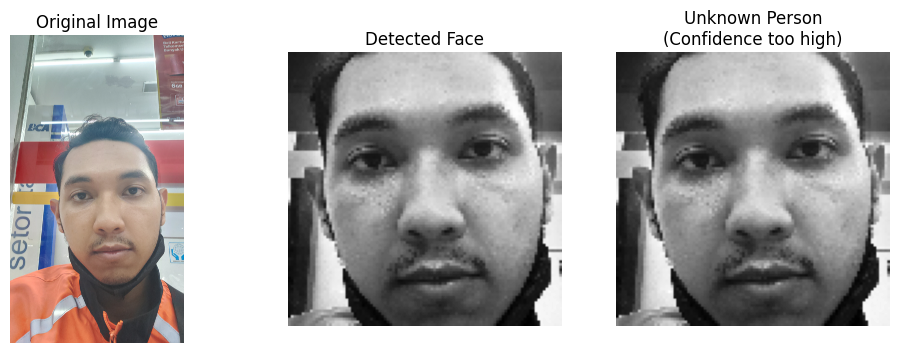

In [117]:
# 1. Tampilkan jumlah data training per kelas
print("Data Training Distribution:")
for label in labels:
    count = sum(1 for name in names if name == label)
    print(f"Class {label}: {count} images")

# 2. Retrain model dengan parameter yang lebih ketat
model = cv2.face.LBPHFaceRecognizer_create(
    radius=2,           # Increase radius (default: 1)
    neighbors=12,       # Increase neighbors (default: 8)
    grid_x=10,         # Increase grid (default: 8)
    grid_y=10,         # Increase grid (default: 8)
    threshold=80.0      # Lower threshold for stricter predictions
)

# 3. Train model dengan data yang seimbang
if len(croped_images) > 0:
    model.train(croped_images, np.array(valid_name_vec))
    print("\nModel training completed")
    
    # Test beberapa gambar training untuk verifikasi
    print("\nVerifying training accuracy:")
    for i in range(min(5, len(croped_images))):
        idx, conf = model.predict(croped_images[i])
        print(f"Expected: {labels[valid_name_vec[i]]}, Predicted: {labels[idx]}, Confidence: {conf:.2f}%")
    
    # Save model
    model.save("lbph_model.yml")
    print("\nModel saved")
else:
    print("Error: No valid faces for training")

# 4. Test gambar baru
test_new_face("new_face/NewFace_Pascalis_01.jpg", threshold=80.0)

Model training completed

Prediction Results:
Predicted Person: Dela
Confidence: 91.35%
Note: Lower confidence means higher certainty


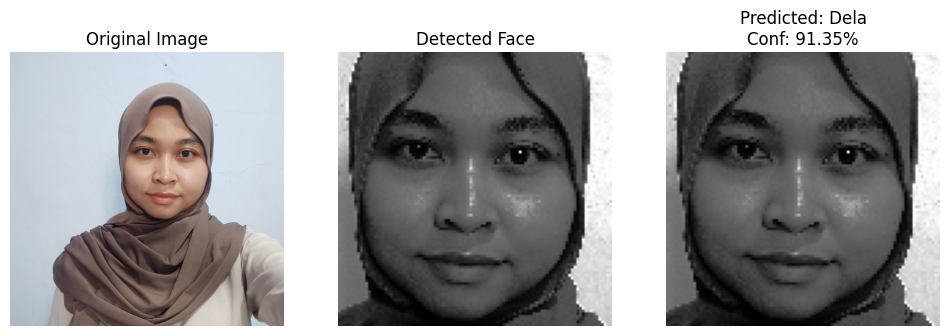

In [113]:
def test_new_face(image_path, threshold=80.0):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Cannot read image from {image_path}")
        return
        
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Tambahkan histogram equalization
    gray = cv2.equalizeHist(gray)
    
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    
    if len(faces) == 0:
        print("No face detected in the image")
        return
        
    x, y, w, h = faces[0]
    face_img = gray[y:y+h, x:x+w]
    face_img = cv2.resize(face_img, (100, 100))
    
    try:
        idx, confidence = model.predict(face_img)
        
        # Batasi confidence maksimum
        if confidence > 1000:  # Jika confidence terlalu tinggi
            print("\nPrediction Results:")
            print("Unknown Person (Confidence too high)")
            print(f"Confidence: {confidence:.2f}%")
        else:
            print("\nPrediction Results:")
            print(f"Predicted Person: {labels[idx]}")
            print(f"Confidence: {confidence:.2f}%")
            print(f"Note: Lower confidence means higher certainty")
        
        # Display results
        plt.figure(figsize=(12, 4))
        
        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')
        
        # Detected face
        plt.subplot(1, 3, 2)
        plt.imshow(face_img, cmap='gray')
        plt.title('Detected Face')
        plt.axis('off')
        
        # Prediction result
        plt.subplot(1, 3, 3)
        plt.imshow(face_img, cmap='gray')
        if confidence > 1000:
            plt.title('Unknown Person\n(Confidence too high)')
        else:
            plt.title(f'Predicted: {labels[idx]}\nConf: {confidence:.2f}%')
        plt.axis('off')
        
        plt.show()
        
    except Exception as e:
        print(f"Error during prediction: {str(e)}")

# Retrain model dengan parameter yang lebih ketat
model = cv2.face.LBPHFaceRecognizer_create(
    radius=1,           # Back to default
    neighbors=8,        # Back to default
    grid_x=8,          # Back to default
    grid_y=8,          # Back to default
    threshold=1000.0    # Set maximum threshold
)

# Train model
if len(croped_images) > 0:
    model.train(croped_images, np.array(valid_name_vec))
    print("Model training completed")
    model.save("lbph_model.yml")

# Test gambar
test_new_face("new_face/NewFace_Dela_01.jpeg", threshold=80.0)